<a href="https://colab.research.google.com/github/rivuletsteph/TIAER/blob/main/streamflow_zarr21_nse_comparison_usgs_gaged_flows_hourly.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# NSE Comparison of **Hourly** USGS Gage Observed Flows and NWM Modeled (Zarr) Flows


---

By Stephanie Brady, Emad Ahmed, and Ritika Prasai  
TIAER @Tarleton State University  
January 31, 2023

The purpose of this notebook is to:   
1) Acquire recent (2015-2020) USGS observed flows at a selected gage within the US;   
2) Aquire recent (2015-2020) modeled flows ([NWM model output data version 2.1 in Zarr format](https://registry.opendata.aws/nwm-archive/)) at the corresponding NWM reach;  
3) perform a Nash–Sutcliffe Efficiency calulation to ascertain acceptability of the modeled flows overall, and by year.

## To Begin
Visit the [OWP National Water Model Interactive Map](https://water.noaa.gov/map). 

In this [example image
](https://photos.app.goo.gl/BAEJteHRKn1jUZ7HA), the USGS Gage ID is `08076997` and the corresponding NWM Reach ID is `1562342`. 

# Section 1. USGS Flows
Credit: Dr. Mohsen Tahmasebi Nasab  
https://www.youtube.com/watch?v=fs5BOUn8zvw




Import Packages

In [1]:
!pip install s3fs
!pip install zarr

import urllib.parse
import urllib.request
import os
import pandas as pd
import numpy as np
import s3fs
import zarr
import fsspec
import xarray as xr
import plotly.graph_objects as go
from plotly.subplots import make_subplots


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Create notebook output folder

In [2]:
!mkdir output

mkdir: cannot create directory ‘output’: File exists


Create a Unique URL to access the USGS stream gage data  
Start date and time were determined by the last 5 years of the NWM flow record.  
The USGS gage can be changed here.

In [3]:
gage_id = '08076997'
start_date = '2016-01-01'
start_datetime = '2016-01-01 00:00'
end_date = '2020-12-31'  
end_datetime = '2020-12-31 23:00'
folder = os.getcwd()+'/output'

(Check that the new output folder was created)

In [4]:
link = "https://nwis.waterservices.usgs.gov/nwis/iv/?sites="+gage_id+"&parameterCd=00060&startDT="+start_date+"T00:00:0-06:00&endDT="+end_date+"T00:00:0-06:00&siteStatus=all&format=rdb"
print("Click here to see the generated USGS link: \n",link)

Click here to see the generated USGS link: 
 https://nwis.waterservices.usgs.gov/nwis/iv/?sites=08076997&parameterCd=00060&startDT=2016-01-01T00:00:0-06:00&endDT=2020-12-31T00:00:0-06:00&siteStatus=all&format=rdb


Download and wrangle 15-minute streamflow, export to a csv

In [5]:
USGS_page = urllib.request.urlopen(link)
downloaded_data = USGS_page.read()

In [6]:
str_data = downloaded_data.decode()
type(str_data)
str_data

"# ---------------------------------- WARNING ----------------------------------------\n# Some of the data that you have obtained from this U.S. Geological Survey database may not \n# have received Director's approval.  Any such data values are qualified as provisional and \n# are subject to revision.  Provisional data are released on the condition that neither the \n# USGS nor the United States Government may be held liable for any damages resulting from its use.\n#  Go to http://help.waterdata.usgs.gov/policies/provisional-data-statement for more information.\n#\n# File-format description:  http://help.waterdata.usgs.gov/faq/about-tab-delimited-output\n# Automated-retrieval info: http://help.waterdata.usgs.gov/faq/automated-retrievals\n#\n# Contact:   gs-w_support_nwisweb@usgs.gov\n# retrieved: 2023-03-16 12:56:10 -04:00\t(nadww01)\n#\n# Data for the following 1 site(s) are contained in this file\n#    USGS 08076997 Clear Ck at Mykawa St nr Pearland, TX\n# ---------------------------

In [7]:
f_str_data = str_data.split('\n')
#f_str_data

In [8]:
station_name = ''

for line in range(len(f_str_data)):
    if f_str_data[line].startswith("#    USGS"):
        station_name=f_str_data[line][3:]
print(station_name)

  USGS 08076997 Clear Ck at Mykawa St nr Pearland, TX


In [9]:
date_flow = ''

for line in range(len(f_str_data)):
    if f_str_data[line].startswith("USGS"):
        data = f_str_data[line][14:]
        columns = data.split('\t')
        rows =  ','.join([columns[0],columns[1],columns[2]])
        date_flow += rows + '\n'
date_flow = date_flow.encode()

with open(folder+'/Raw_USGS_15m_Data_for_' + gage_id  + '.txt', 'wb') as text:
        text.write(date_flow)

In [10]:
filename = folder+'/Raw_USGS_15m_Data_for_' + gage_id  + '.txt'
columns = ['Date_Time','TZ', 'USGS_cfs']
raw_usgs_df = pd.read_csv(filename,header=None,names=columns,parse_dates=[0])
raw_usgs_df=raw_usgs_df.set_index(['Date_Time'])
raw_usgs_df['USGS_cfs']=pd.to_numeric(raw_usgs_df['USGS_cfs'], errors='coerce')
raw_usgs_df

,TZ,USGS_cfs
Date_Time,,
2016-01-01 01:00:00,CST,20.5
2016-01-01 01:15:00,CST,20.5
2016-01-01 01:30:00,CST,20.5
2016-01-01 01:45:00,CST,20.5
2016-01-01 02:00:00,CST,20.5
...,...,...
2020-12-31 00:00:00,CST,80.7
2020-12-31 00:15:00,CST,80.7
2020-12-31 00:30:00,CST,80.7


Create Hydrograph for the Raw USGS data

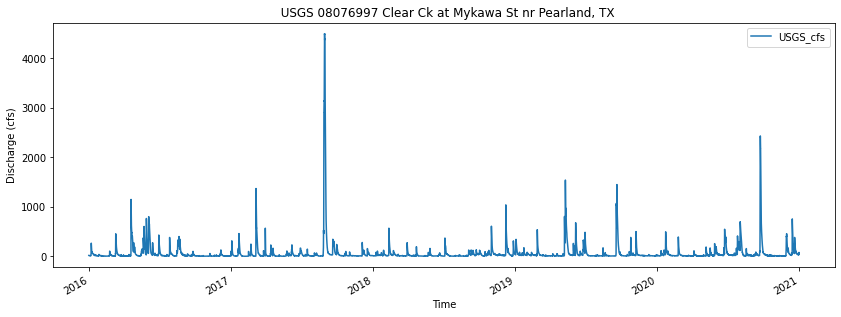

In [11]:
raw_usgs_df.plot(figsize=(14,5), title= station_name, xlabel="Time", ylabel="Discharge (cfs)");

Reset the index to an integer "location"

In [12]:
usgs_df_15min=raw_usgs_df.reset_index()

In [13]:
usgs_df_15min

,Date_Time,TZ,USGS_cfs
0,2016-01-01 01:00:00,CST,20.5
1,2016-01-01 01:15:00,CST,20.5
2,2016-01-01 01:30:00,CST,20.5
3,2016-01-01 01:45:00,CST,20.5
4,2016-01-01 02:00:00,CST,20.5
...,...,...,...
174559,2020-12-31 00:00:00,CST,80.7
174560,2020-12-31 00:15:00,CST,80.7
174561,2020-12-31 00:30:00,CST,80.7
174562,2020-12-31 00:45:00,CST,79.9


Resample to hourly data

In [14]:
usgs_df_15min = usgs_df_15min.set_index('Date_Time')

In [15]:
usgs_df_15min=usgs_df_15min.resample("H").mean()

In [16]:
usgs_df_15min

,USGS_cfs
Date_Time,
2016-01-01 01:00:00,20.500
2016-01-01 02:00:00,20.500
2016-01-01 03:00:00,20.500
2016-01-01 04:00:00,20.500
2016-01-01 05:00:00,20.500
...,...
2020-12-30 21:00:00,72.650
2020-12-30 22:00:00,77.975
2020-12-30 23:00:00,80.925


Calculate discharge in CMS

In [17]:
usgs_df=usgs_df_15min.reset_index()

In [18]:
usgs_df["USGS_cms"] = usgs_df["USGS_cfs"]/35.314666212661

Export wrangled USGS dataframe to a csv file

In [19]:
usgs_df

,Date_Time,USGS_cfs,USGS_cms
0,2016-01-01 01:00:00,20.500,0.580495
1,2016-01-01 02:00:00,20.500,0.580495
2,2016-01-01 03:00:00,20.500,0.580495
3,2016-01-01 04:00:00,20.500,0.580495
4,2016-01-01 05:00:00,20.500,0.580495
...,...,...,...
43820,2020-12-30 21:00:00,72.650,2.057219
43821,2020-12-30 22:00:00,77.975,2.208006
43822,2020-12-30 23:00:00,80.925,2.291541
43823,2020-12-31 00:00:00,80.500,2.279506


In [20]:
usgs_df.to_csv(folder +'/USGS_Data_for_' + str(gage_id)  + '.csv')

# Section 2.  NWM Flows


Credits: 

[Rich Signell](https://github.com/rsignell-usgs)  
[Explore the National Water Model Reanalysis](https://nbviewer.org/gist/rsignell-usgs/78a4ce00360c65bc99764aa3e88a2493)

[James McCreight](https://github.com/jmccreight)  
[NWM v2.1 Retrospective Zarr Usage Example
](https://github.com/NCAR/rechunk_retro_nwm_v21/blob/main/notebooks/usage_example_streamflow_timeseries.ipynb)

Identify the Reach ID (Refer to the section "To Begin").  
The Reach ID can be changed here.


In [21]:
reach_id=1562342

Setup Dask.distributed the [Easy Way](https://distributed.dask.org/en/stable/quickstart.html#setup-dask-distributed-the-easy-way)

In [22]:
from dask.distributed import Client, progress
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 2
Total threads: 2,Total memory: 12.68 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:36997,Workers: 2
Dashboard: http://127.0.0.1:8787/status,Total threads: 2
Started: Just now,Total memory: 12.68 GiB
Comm: tcp://127.0.0.1:44013,Total threads: 1
Dashboard: http://127.0.0.1:38027/status,Memory: 6.34 GiB
Nanny: tcp://127.0.0.1:42589,


Point to the AWS CLI (Amazon Web Services Command Line Interface) where the data is storred in Zarr format.

In [23]:
url = 's3://noaa-nwm-retrospective-2-1-zarr-pds/chrtout.zarr'

Print the [CPU Time and Wall Time](https://ipython.readthedocs.io/en/stable/interactive/magics.html?highlight=%25time#magic-time)  
Load and decode a dataset from the Zarr [store](https://docs.xarray.dev/en/stable/generated/xarray.open_zarr.html)  
Usually takes about 5 seconds

In [24]:
%%time
nwm_ds_hourly = xr.open_zarr(fsspec.get_mapper(url, anon=True), consolidated=True)

CPU times: user 3.22 s, sys: 317 ms, total: 3.53 s
Wall time: 9.11 s


Print the dataset description

In [25]:
nwm_ds_hourly

<xarray.Dataset>
Dimensions:     (feature_id: 2776738, time: 367439)
Coordinates:
    elevation   (feature_id) float32 dask.array<chunksize=(2776738,), meta=np.ndarray>
  * feature_id  (feature_id) int32 101 179 181 ... 1180001803 1180001804
    gage_id     (feature_id) |S15 dask.array<chunksize=(2776738,), meta=np.ndarray>
    latitude    (feature_id) float32 dask.array<chunksize=(2776738,), meta=np.ndarray>
    longitude   (feature_id) float32 dask.array<chunksize=(2776738,), meta=np.ndarray>
    order       (feature_id) int32 dask.array<chunksize=(2776738,), meta=np.ndarray>
  * time        (time) datetime64[ns] 1979-02-01T01:00:00 ... 2020-12-31T23:0...
Data variables:
    crs         |S1 ...
    streamflow  (time, feature_id) float64 dask.array<chunksize=(672, 30000), meta=np.ndarray>
    velocity    (time, feature_id) float64 dask.array<chunksize=(672, 30000), meta=np.ndarray>
Attributes:
    TITLE:                OUTPUT FROM WRF-Hydro v5.2.0-beta2
    code_version:         v5.2.0-beta2
    featureType:          timeSeries
    model_configuration:  retrospective
    proj4:                +proj=lcc +units=m +a=6370000.0 +b=6370000.0 +lat_1...

Identify what reach or reaches for which the NWM streamflows will be downloaded.

For multiple reaches, use the syntax "reaches = np.sort(np.array([x1,x2,...]))".

In [26]:
reach = np.sort(np.array([reach_id]))

Print the wall time.  
Extract the flow data for the specified reach and  time period.  
Typically takes about 30 seconds.

In [27]:
%%time
nwm_ds_hourly_subset = nwm_ds_hourly.streamflow.sel(feature_id=reach, time=slice(start_datetime,end_datetime)).compute()

CPU times: user 5.37 s, sys: 566 ms, total: 5.93 s
Wall time: 48.2 s


In [28]:
nwm_ds_hourly_subset

<xarray.DataArray 'streamflow' (time: 43848, feature_id: 1)>
array([[ 0.86999998],
       [ 0.85999998],
       [ 0.85999998],
       ...,
       [17.9699996 ],
       [16.26999964],
       [14.37999968]])
Coordinates:
    elevation   (feature_id) float32 11.32
  * feature_id  (feature_id) int32 1562342
    gage_id     (feature_id) |S15 b'       08076997'
    latitude    (feature_id) float32 29.6
    longitude   (feature_id) float32 -95.31
    order       (feature_id) int32 2
  * time        (time) datetime64[ns] 2016-01-01 ... 2020-12-31T23:00:00
Attributes:
    grid_mapping:  crs
    long_name:     River Flow
    units:         m3 s-1

Convert the dataset array into a dataframe.

In [29]:
raw_nwm_df= nwm_ds_hourly_subset.to_pandas()

In [30]:
raw_nwm_df

feature_id,1562342
time,
2016-01-01 00:00:00,0.87
2016-01-01 01:00:00,0.86
2016-01-01 02:00:00,0.86
2016-01-01 03:00:00,0.85
2016-01-01 04:00:00,0.84
...,...
2020-12-31 19:00:00,17.37
2020-12-31 20:00:00,18.67
2020-12-31 21:00:00,17.97


Create Hydrograph for the Raw NWM data (hourly)

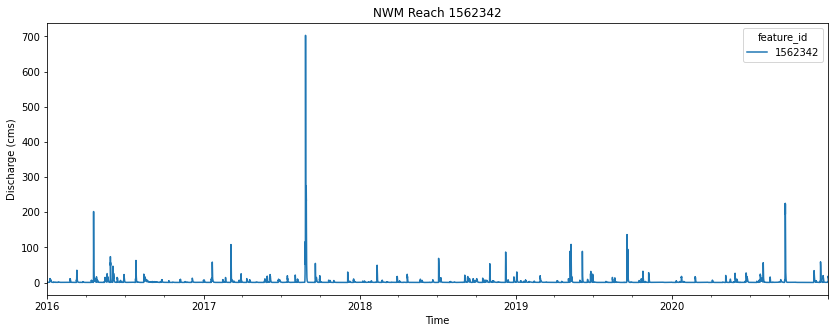

In [31]:
raw_nwm_df.plot(figsize=(14,5), title= "NWM Reach "+ str(reach_id), xlabel="Time", ylabel="Discharge (cms)");

Create a new index column

In [32]:
nwm_df=raw_nwm_df.reset_index()

Update the column names

In [33]:
nwm_df.rename({'time': 'Date_Time', reach_id: 'NWM_cms'}, axis=1, inplace=True)

Calulate discharge in CFS



In [34]:
nwm_df["NWM_cfs"] = nwm_df["NWM_cms"]*35.314666212661

In [35]:
nwm_df['Date_Time'] = nwm_df['Date_Time'].dt.tz_localize('UTC').dt.tz_convert('America/Chicago').dt.tz_localize(None)

Export wrangled NWM dataframe to a csv file

In [36]:
nwm_df

feature_id,Date_Time,NWM_cms,NWM_cfs
0,2015-12-31 18:00:00,0.87,30.723759
1,2015-12-31 19:00:00,0.86,30.370612
2,2015-12-31 20:00:00,0.86,30.370612
3,2015-12-31 21:00:00,0.85,30.017466
4,2015-12-31 22:00:00,0.84,29.664319
...,...,...,...
43843,2020-12-31 13:00:00,17.37,613.415738
43844,2020-12-31 14:00:00,18.67,659.324803
43845,2020-12-31 15:00:00,17.97,634.604538
43846,2020-12-31 16:00:00,16.27,574.569606


In [37]:
nwm_df.to_csv(folder +'/NWM_Data_for_' + str(reach_id)  + '.csv')

Merge the tables

In [38]:
nwm_usgs_df=pd.merge(nwm_df, usgs_df)

In [39]:
nwm_usgs_df

,Date_Time,NWM_cms,NWM_cfs,USGS_cfs,USGS_cms
0,2016-01-01 01:00:00,0.83,29.311172,20.500,0.580495
1,2016-01-01 02:00:00,0.82,28.958026,20.500,0.580495
2,2016-01-01 03:00:00,0.82,28.958026,20.500,0.580495
3,2016-01-01 04:00:00,0.81,28.604879,20.500,0.580495
4,2016-01-01 05:00:00,0.81,28.604879,20.500,0.580495
...,...,...,...,...,...
43820,2020-12-30 21:00:00,1.09,38.492985,72.650,2.057219
43821,2020-12-30 22:00:00,1.07,37.786692,77.975,2.208006
43822,2020-12-30 23:00:00,1.06,37.433545,80.925,2.291541
43823,2020-12-31 00:00:00,1.05,37.080399,80.500,2.279506


In [40]:
nwm_usgs_df = nwm_usgs_df[['Date_Time', 'NWM_cfs', 'NWM_cms', 'USGS_cfs', 'USGS_cms']]

Export the table

In [41]:
nwm_usgs_df

,Date_Time,NWM_cfs,NWM_cms,USGS_cfs,USGS_cms
0,2016-01-01 01:00:00,29.311172,0.83,20.500,0.580495
1,2016-01-01 02:00:00,28.958026,0.82,20.500,0.580495
2,2016-01-01 03:00:00,28.958026,0.82,20.500,0.580495
3,2016-01-01 04:00:00,28.604879,0.81,20.500,0.580495
4,2016-01-01 05:00:00,28.604879,0.81,20.500,0.580495
...,...,...,...,...,...
43820,2020-12-30 21:00:00,38.492985,1.09,72.650,2.057219
43821,2020-12-30 22:00:00,37.786692,1.07,77.975,2.208006
43822,2020-12-30 23:00:00,37.433545,1.06,80.925,2.291541
43823,2020-12-31 00:00:00,37.080399,1.05,80.500,2.279506


In [42]:
nwm_usgs_df.to_csv(folder +'/NWM' + str(reach_id) +'_USGS' + str(gage_id)  + '.csv')

Create the Plotly graph  
Typically takes about 10 seconds

In [43]:
flow_fig = go.Figure()

flow_fig.add_trace(go.Scatter(x=nwm_usgs_df['Date_Time'], y=nwm_usgs_df['USGS_cfs'], name="USGS Station "+ str(gage_id),
                         line = dict(color='blue', width=1.5 )))
flow_fig.add_trace(go.Scatter(x=nwm_usgs_df['Date_Time'], y=nwm_usgs_df['NWM_cfs'], name="NWM Reach "+str(reach_id),
                         line = dict(color='red', width=1.5, dash='dash')))

flow_fig.update_layout(title="Daily streamflow at" +str(station_name), 
                  yaxis_title='Discharge (cfs)')

flow_fig.show()

# Section 3. Nash Sutcliffe Efficiency Calculation

Draft

In [44]:
!pip install hydroeval
import hydroeval as he

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [45]:
def NSE_calc (modeled, observed):
    NSE = (he.evaluator(he.nse, modeled, observed))
    return(NSE)
    
def summary (x):
  result = {
      'year':x['Date_Time'].min(),
      'date_min':x['Date_Time'].min(),
      'date_max':x['Date_Time'].max(),
      'date_range':x['Date_Time'].max() - x['Date_Time'].min(),
      'USGS_flow_min':x['USGS_cfs'].min(),
      'NWM_flow_min':x['NWM_cfs'].min(),
      'nse':NSE_calc(x['NWM_cms'],x['USGS_cms']).astype(float)
  }
  return pd.Series(result)

In [46]:
modeled = nwm_usgs_df["NWM_cfs"]
observed = nwm_usgs_df["USGS_cfs"]

cummulative_nse = he.evaluator(he.nse, modeled, observed)
print(round(cummulative_nse[0],2))

-1.93


In [47]:
NSE_nwm_usgs_df = nwm_usgs_df.groupby(pd.Grouper(key='Date_Time', freq='1Y')).apply(summary)

In [48]:
NSE_df=NSE_nwm_usgs_df.reset_index()

In [49]:
NSE_df=NSE_df.drop(columns=['Date_Time'])

In [50]:
NSE_df

,year,date_min,date_max,date_range,USGS_flow_min,NWM_flow_min,nse
0,2016-01-01 01:00:00,2016-01-01 01:00:00,2016-12-31 23:00:00,365 days 22:00:00,3.6650,18.716773,[-2.074207964308412]
1,2017-01-01 00:00:00,2017-01-01 00:00:00,2017-12-31 23:00:00,364 days 23:00:00,3.1525,19.069919,[-2.353488989133431]
2,2018-01-01 00:00:00,2018-01-01 00:00:00,2018-12-31 23:00:00,364 days 23:00:00,3.8475,18.010479,[-2.4845967779765803]
3,2019-01-01 00:00:00,2019-01-01 00:00:00,2019-12-31 23:00:00,364 days 23:00:00,7.1000,19.069919,[-0.7016386237265462]
4,2020-01-01 00:00:00,2020-01-01 00:00:00,2020-12-31 01:00:00,365 days 01:00:00,8.7725,17.304186,[-0.8213654192262676]


In [51]:
NSE_df['year'] =  NSE_df['year'].dt.strftime('%Y')

In [52]:
NSE_df['nse']=round(NSE_df['nse'].astype(float),2)

In [53]:
NSE_df

,year,date_min,date_max,date_range,USGS_flow_min,NWM_flow_min,nse
0,2016,2016-01-01 01:00:00,2016-12-31 23:00:00,365 days 22:00:00,3.6650,18.716773,-2.07
1,2017,2017-01-01 00:00:00,2017-12-31 23:00:00,364 days 23:00:00,3.1525,19.069919,-2.35
2,2018,2018-01-01 00:00:00,2018-12-31 23:00:00,364 days 23:00:00,3.8475,18.010479,-2.48
3,2019,2019-01-01 00:00:00,2019-12-31 23:00:00,364 days 23:00:00,7.1000,19.069919,-0.70
4,2020,2020-01-01 00:00:00,2020-12-31 01:00:00,365 days 01:00:00,8.7725,17.304186,-0.82


In [55]:
import plotly.express as px

nse_fig = px.bar(NSE_df, x='year', y='nse', text_auto='.3')
nse_fig.update_yaxes(range=[-5, 1.2])
nse_fig.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
nse_fig.update_layout(title="Nash–Sutcliffe model efficiency coefficient for" +str(station_name), 
                  yaxis_title='NSE')
nse_fig.update_xaxes( visible=True, showticklabels=True)
nse_fig.update_layout(xaxis_title=None)
nse_fig.update_layout(margin=dict(l=20, r=20, t=60, b=60),paper_bgcolor="whitesmoke")
#nse_fig.update_traces(marker_color='blue')
nse_fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
nse_fig.add_annotation(dict(font=dict(size=14),
                                        x=0,
                                        y=-0.12,
                                        showarrow=False,
                                        text= ("Cummulative NSE = "+str(round(cummulative_nse[0],2))),
                                        textangle=0,
                                        xanchor='left',
                                        xref="paper",
                                        yref="paper"))
nse_fig.add_trace(go.Scatter(x=NSE_df['year'], y=NSE_df['nse'], name="Annual NSE",
                         line = dict(color='rgb(8,48,107)', width=1.5 )))

nse_fig.show()